In [ ]:
! pip install node2vec

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 54.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.5/26.5 MB 62.3 MB/s eta 0:00:00
  Attempting uninstall: networkx
    Found existing installation: networkx 3.0
    Uninstalling networkx-3.0:
      Successfully uninstalled networkx-3.0
  Attempting uninstall: gensim
    Found existing installation: gensim 3.6.0
    Uninstalling gensim-3.6.0:
      Successfully uninstalled gensim-3.6.0


In [ ]:
! pip uninstall gensim

Found existing installation: gensim 4.3.1
Uninstalling gensim-4.3.1:
  Would remove:
    /usr/local/lib/python3.9/dist-packages/gensim-4.3.1.dist-info/*
    /usr/local/lib/python3.9/dist-packages/gensim/*
Proceed (Y/n)? Y
  Successfully uninstalled gensim-4.3.1


In [ ]:
! pip install gensim==3.8.3

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.4/23.4 MB 24.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for gensim: filename=gensim-3.8.3-cp39-cp39-linux_x86_64.whl size=26528015 sha256=bae3cedfa6d7b6ace4994b2230efa66350a979b81ac1dc616409fa4177ea15e8
  Stored in directory: /root/.cache/pip/wheels/ca/5d/af/618594ec2f28608c1d6ee7d2b7e95a3e9b06551e3b80a491d6
Successfully built gensim
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
node2vec 0.4.6 requires gensim<5.0.0,>=4.1.2, but you have gensim 3.8.3 which is incompatible.


In [ ]:
# Import gensim and verify that we have the right version
import gensim
print(gensim.__version__)

3.8.3


In [ ]:
! pip install catboost

In [2]:
# Import libraries
import os
import sys
import numpy as np 
import pandas as pd
import networkx as nx
import scipy
import matplotlib.pyplot as plt
import networkx as nx

from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV
import pickle
import json

import catboost as cb

from sklearn.ensemble import RandomForestClassifier

import xgboost as xgb
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from scipy.stats import randint, uniform
from sklearn.metrics import accuracy_score

In [5]:
graph_path = 'D:/DSBA Lectures/MLNS/twitch_egos/twitch_edges.json'
target_path = 'D:/DSBA Lectures/MLNS/twitch_egos/twitch_target.csv'

save_path = 'D:/DSBA Lectures/MLNS/twitch_egos/graph_list.pickle'
save_features_df_path = 'D:/DSBA Lectures/MLNS/twitch_egos/features_df.csv'

In [8]:
# Import target file
target = pd.read_csv(target_path)
y = target['target']

# We'll use this to construct df features later
df = target['id'].sort_values().reset_index().iloc[:,[1]]

In [9]:
target

,id,target
0,0,0
1,1,0
2,2,0
3,3,1
4,4,0
...,...,...
127089,127089,1
127090,127090,1
127091,127091,1
127092,127092,1


In [6]:
"""
Run this cell once and then save the graph list
After that, you can then just load the pickle of graph list 
to use it later
"""

# Load the json filie
f = open(graph_path)
datas = json.load(f)


graphs = {}
for key in datas:
  graph = nx.from_edgelist(datas[key])
  graph.add_nodes_from(sorted(list(graph.nodes())))
  graphs[key] = graph

# Save the graph list to then load this later
pickle.dump(graphs, open(save_path, 'wb'))

In [6]:
# Load the graph list file (for future use)
graphs = pickle.load(open(save_path, 'rb')) 

In [7]:
# Here we define some features
def average_graph_degree(G):
  return np.average(list(nx.degree_centrality(G).values()))

def number_of_endpoints(G):
  return len([deg for deg in dict(G.degree()).values() if deg == 1])

def average_closeness_centrality(G):
  return np.average(list(nx.closeness_centrality(G).values()))

def percent_central(G):
  all_ecc = list(nx.eccentricity(G).values())
  nb_nodes = len(list(G.nodes()))
  frac = len([ecc for ecc in all_ecc if ecc == min(all_ecc)]) / nb_nodes
  return frac

def average_neg_degree(G):
  return np.average(list(nx.average_neighbor_degree(G).values()))

features_functions = [
    nx.transitivity,
    nx.average_clustering,
    nx.node_connectivity,
    nx.edge_connectivity,
    nx.diameter,
    nx.radius,
    average_graph_degree,
    number_of_endpoints, # Nb of nodes with degree 1
    average_closeness_centrality,
    nx.density,
    average_neg_degree
]

In [8]:
for f in features_functions:
  name = str(f).split()[1]
  df[name] = df['id'].apply(lambda x: f(graphs[str(x)]))

df.to_csv(save_features_df_path, index=False)

In [6]:
# Load the feature df (for later use)
feature_df = pd.read_csv(save_features_df_path)

In [10]:
feature_df['target'] = target['target']

In [11]:
feature_df

,id,transitivity,average_clustering,node_connectivity,edge_connectivity,diameter,radius,average_graph_degree,number_of_endpoints,average_closeness_centrality,density,average_neg_degree,target
0,0,0.155899,0.507563,1,1,2,1,0.096825,14,0.532128,0.096825,22.479464,0
1,1,0.504098,0.681886,1,1,2,1,0.240244,3,0.575689,0.240244,18.146378,0
2,2,0.217510,0.525425,1,1,2,1,0.149194,6,0.548104,0.149194,16.561064,0
3,3,0.445610,0.672611,1,1,2,1,0.206259,3,0.565467,0.206259,17.671865,1
4,4,0.102564,0.380519,1,1,2,1,0.125541,11,0.543924,0.125541,15.379329,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
127089,127089,0.360529,0.607536,1,1,2,1,0.185897,4,0.558574,0.185897,18.323266,1
127090,127090,0.247557,0.600929,1,1,2,1,0.137815,8,0.544648,0.137815,19.672260,1
127091,127091,0.103093,0.437336,1,1,2,1,0.078049,18,0.526159,0.078049,26.608130,1
127092,127092,0.302632,0.662332,1,1,2,1,0.210526,3,0.570509,0.210526,10.119298,1


In [12]:
selected_feature = ['transitivity',	'average_clustering','number_of_endpoints',	'average_closeness_centrality','average_neg_degree']
x_data = feature_df[selected_feature]
y_data = feature_df[['target']]

In [15]:
# Split
X_train, X_test, y_train, y_test = train_test_split(x_data, y_data, test_size=0.2, random_state=42)

In [31]:
# import pandas as pd
# import numpy as np
# compute the correlation matrix
corr_df = feature_df.drop(['diameter', 'radius', 'id', 'node_connectivity', 'edge_connectivity'], axis=1)
corr_matrix = corr_df.corr()
print(corr_matrix)

                              transitivity  average_clustering  \
transitivity                      1.000000            0.751668   
average_clustering                0.751668            1.000000   
average_graph_degree              0.884542            0.604365   
number_of_endpoints              -0.713042           -0.789482   
average_closeness_centrality      0.842529            0.557004   
density                           0.884542            0.604365   
average_neg_degree               -0.312987           -0.266619   
target                            0.299953            0.220716   

                              average_graph_degree  number_of_endpoints  \
transitivity                              0.884542            -0.713042   
average_clustering                        0.604365            -0.789482   
average_graph_degree                      1.000000            -0.697763   
number_of_endpoints                      -0.697763             1.000000   
average_closeness_centrality  

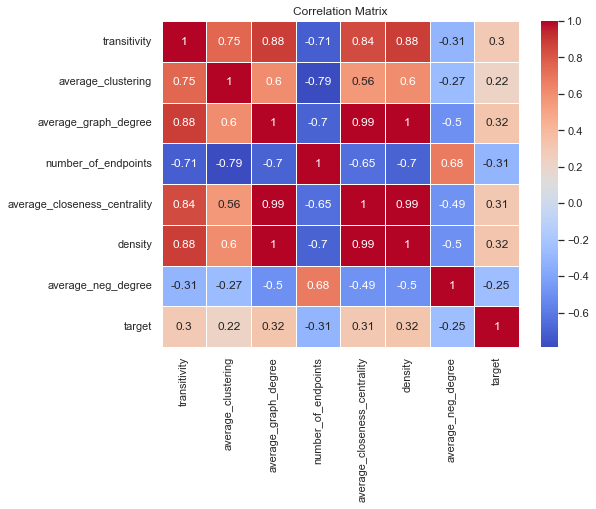

In [32]:
# create a heatmap
import seaborn as sns
sns.set(style='white')
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, cmap='coolwarm', annot=True, linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

# Modeling with XGBoost

## Without hyper parameters tuning 

In [16]:
# Define XGBoost classifier with default parameters
xgb_model = xgb.XGBClassifier()

# Perform cross-validation with the tuned model
scores = cross_val_score(xgb_model, X_train, y_train, cv=5, scoring='accuracy')

# Print the mean and standard deviation of the cross-validation scores
print("Cross-validation scores: ", scores)
print("Mean Accuracy: ", scores.mean())
print("Standard Deviation: ", scores.std())

# Fit the tuned model to the training data
xgb_model.fit(X_train, y_train)

# Predict the test data
y_pred = xgb_model.predict(X_test)

# Evaluate the model on the test data
print("Accuracy on Test Data: ", accuracy_score(y_test, y_pred))

Cross-validation scores:  [0.70189329 0.70582739 0.70386034 0.70386034 0.70272928]
Mean Accuracy:  0.7036341283501353
Standard Deviation:  0.001323783534468961
Accuracy on Test Data:  0.7044730319839491


## With hyper parameters tuning

In [13]:
# Define XGBoost classifier with default parameters
xgb_model = xgb.XGBClassifier()

# Define the range of hyperparameters to search over
params = {
    'n_estimators': randint(100, 1000),
    'max_depth': randint(3, 10),
    'learning_rate': uniform(0.01, 0.5),
    'subsample': uniform(0.5, 0.5),
    'colsample_bytree': uniform(0.5, 0.5),
    'gamma': uniform(0, 1),
    'reg_alpha': uniform(0, 1),
    'reg_lambda': uniform(0, 1)  # reg_alpha and reg_lambda are parameter for regularization. Use to avoid overfitting
}

# Define randomized search cross-validation with 5-fold
rand_search = RandomizedSearchCV(
    xgb_model, params, n_iter=100, cv=5, scoring='accuracy', random_state=42
)

# Fit the model
rand_search.fit(X_train, y_train)

# Print the best hyperparameters and accuracy
print("Best Hyperparameters: ", rand_search.best_params_)
print("Best Accuracy: ", rand_search.best_score_)

# Create XGBoost classifier with tuned hyperparameters
xgb_model_tuned = xgb.XGBClassifier(
    n_estimators=rand_search.best_params_['n_estimators'],
    max_depth=rand_search.best_params_['max_depth'],
    learning_rate=rand_search.best_params_['learning_rate'],
    subsample=rand_search.best_params_['subsample'],
    colsample_bytree=rand_search.best_params_['colsample_bytree'],
    gamma=rand_search.best_params_['gamma'],
    reg_alpha=rand_search.best_params_['reg_alpha'],
    reg_lambda=rand_search.best_params_['reg_lambda'],
    random_state=42
)

# Perform cross-validation with the tuned model
scores = cross_val_score(xgb_model_tuned, X_train, y_train, cv=5, scoring='accuracy')

# Print the mean and standard deviation of the cross-validation scores
print("Cross-validation scores: ", scores)
print("Mean Accuracy: ", scores.mean())
print("Standard Deviation: ", scores.std())

# Fit the tuned model to the training data
xgb_model_tuned.fit(X_train, y_train)

# Predict the test data
y_pred = xgb_model_tuned.predict(X_test)

# Evaluate the model on the test data
print("Accuracy on Test Data: ", accuracy_score(y_test, y_pred))


Best Hyperparameters:  {'colsample_bytree': 0.8844588706576988, 'gamma': 0.06623597785186586, 'learning_rate': 0.03293063320231648, 'max_depth': 8, 'n_estimators': 152, 'reg_alpha': 0.3474134082254142, 'reg_lambda': 0.20913079107851418, 'subsample': 0.7898249672358693}
Best Accuracy:  0.7052569461519548
Cross-validation scores:  [0.70361446 0.70745021 0.70454881 0.70597492 0.70494222]
Mean Accuracy:  0.7053061224489796
Standard Deviation:  0.0013124084061703458
Accuracy on Test Data:  0.7064794051693615


# Modeling with CATBoost

## Without hyper parameters tuning 

In [17]:
# Define XGBoost classifier with default parameters
cb_model = cb.CatBoostClassifier()

# Perform cross-validation with the tuned model
scores = cross_val_score(cb_model, X_train, y_train, cv=5, scoring='accuracy')

# Print the mean and standard deviation of the cross-validation scores
print("Cross-validation scores: ", scores)
print("Mean Accuracy: ", scores.mean())
print("Standard Deviation: ", scores.std())

# Fit the tuned model to the training data
cb_model.fit(X_train, y_train)

# Predict the test data
y_pred = cb_model.predict(X_test)

# Evaluate the model on the test data
print("Accuracy on Test Data: ", accuracy_score(y_test, y_pred))

Learning rate set to 0.067396
0:	learn: 0.6813802	total: 210ms	remaining: 3m 30s
1:	learn: 0.6711939	total: 219ms	remaining: 1m 49s
2:	learn: 0.6623105	total: 229ms	remaining: 1m 16s
3:	learn: 0.6546160	total: 239ms	remaining: 59.5s
4:	learn: 0.6479092	total: 248ms	remaining: 49.3s
5:	learn: 0.6422335	total: 257ms	remaining: 42.6s
6:	learn: 0.6372742	total: 267ms	remaining: 37.9s
7:	learn: 0.6328473	total: 277ms	remaining: 34.4s
8:	learn: 0.6290060	total: 288ms	remaining: 31.7s
9:	learn: 0.6256509	total: 300ms	remaining: 29.7s
10:	learn: 0.6227227	total: 311ms	remaining: 28s
11:	learn: 0.6201827	total: 322ms	remaining: 26.5s
12:	learn: 0.6179502	total: 330ms	remaining: 25.1s
13:	learn: 0.6160315	total: 340ms	remaining: 24s
14:	learn: 0.6143591	total: 351ms	remaining: 23s
15:	learn: 0.6128905	total: 361ms	remaining: 22.2s
16:	learn: 0.6115993	total: 371ms	remaining: 21.5s
17:	learn: 0.6104611	total: 381ms	remaining: 20.8s
18:	learn: 0.6094873	total: 391ms	remaining: 20.2s
19:	learn: 0.6

## With hyper parameters tuning 

In [15]:
# Define XGBoost classifier with default parameters
cb_model = cb.CatBoostClassifier()

# Define the range of hyperparameters to search over
params = {
    'iterations': randint(100, 1000),
    'depth': randint(3, 10),
    'learning_rate': uniform(0.01, 0.5),
    'subsample': uniform(0.5, 0.5),
    'colsample_bylevel': uniform(0.5, 0.5),
    'l2_leaf_reg': uniform(0, 1),
}

# Define randomized search cross-validation with 5-fold
rand_search = RandomizedSearchCV(
    cb_model, params, n_iter=100, cv=5, scoring='accuracy', random_state=42
)

# Fit the model
rand_search.fit(X_train, y_train)

# Print the best hyperparameters and accuracy
print("Best Hyperparameters: ", rand_search.best_params_)
print("Best Accuracy: ", rand_search.best_score_)

# Create XGBoost classifier with tuned hyperparameters
cb_model_tuned = cb.CatBoostClassifier(
    iterations=rand_search.best_params_['iterations'],
    depth=rand_search.best_params_['depth'],
    learning_rate=rand_search.best_params_['learning_rate'],
    subsample=rand_search.best_params_['subsample'],
    colsample_bylevel=rand_search.best_params_['colsample_bylevel'],
    l2_leaf_reg=rand_search.best_params_['l2_leaf_reg'],
    random_state=42
)

# Perform cross-validation with the tuned model
scores = cross_val_score(cb_model_tuned, X_train, y_train, cv=5, scoring='accuracy')

# Print the mean and standard deviation of the cross-validation scores
print("Cross-validation scores: ", scores)
print("Mean Accuracy: ", scores.mean())
print("Standard Deviation: ", scores.std())

# Fit the tuned model to the training data
cb_model_tuned.fit(X_train, y_train)

# Predict the test data
y_pred = cb_model_tuned.predict(X_test)

# Evaluate the model on the test data
print("Accuracy on Test Data: ", accuracy_score(y_test, y_pred))

0:	learn: 0.6468123	total: 230ms	remaining: 1m 24s
1:	learn: 0.6246639	total: 244ms	remaining: 44.9s
2:	learn: 0.6134832	total: 259ms	remaining: 31.7s
3:	learn: 0.6081901	total: 271ms	remaining: 24.8s
4:	learn: 0.6054178	total: 285ms	remaining: 20.8s
5:	learn: 0.6038275	total: 298ms	remaining: 18.1s
6:	learn: 0.6027701	total: 310ms	remaining: 16.1s
7:	learn: 0.6022484	total: 320ms	remaining: 14.5s
8:	learn: 0.6016801	total: 332ms	remaining: 13.3s
9:	learn: 0.6015489	total: 340ms	remaining: 12.2s
10:	learn: 0.6013351	total: 352ms	remaining: 11.5s
11:	learn: 0.6011166	total: 363ms	remaining: 10.8s
12:	learn: 0.6009232	total: 375ms	remaining: 10.3s
13:	learn: 0.6007479	total: 385ms	remaining: 9.79s
14:	learn: 0.6005552	total: 397ms	remaining: 9.39s
15:	learn: 0.6003831	total: 408ms	remaining: 9.03s
16:	learn: 0.6001023	total: 419ms	remaining: 8.7s
17:	learn: 0.5997489	total: 430ms	remaining: 8.41s
18:	learn: 0.5995124	total: 441ms	remaining: 8.15s
19:	learn: 0.5993836	total: 452ms	remaini

# Modeling with RandomForest

## Without hyper parameters tuning 

In [18]:
# Define Random Forest classifier with default parameters
rf_model = RandomForestClassifier()

# Perform cross-validation with the tuned model
scores = cross_val_score(rf_model, X_train, y_train, cv=5, scoring='accuracy')

# Print the mean and standard deviation of the cross-validation scores
print("Cross-validation scores: ", scores)
print("Mean Accuracy: ", scores.mean())
print("Standard Deviation: ", scores.std())

# Fit the tuned model to the training data
rf_model.fit(X_train, y_train)

# Predict the test data
y_pred = rf_model.predict(X_test)

# Evaluate the model on the test data
print("Accuracy on Test Data: ", accuracy_score(y_test, y_pred))

D:\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
D:\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
D:\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
D:\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change

Cross-validation scores:  [0.68281288 0.6873371  0.68104254 0.68286206 0.68138677]
Mean Accuracy:  0.6830882714531595
Standard Deviation:  0.00224765267319144


C:\Users\swap9\AppData\Local\Temp\ipykernel_13408\4228981144.py:13: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf_model.fit(X_train, y_train)


Accuracy on Test Data:  0.6803178724576104


## With hyper parameters tuning 

In [14]:
# Define Random Forest classifier with default parameters
rf_model = RandomForestClassifier()

# Define the range of hyperparameters to search over
params = {
    'n_estimators': randint(100, 1000),
    'max_depth': randint(3, 10),
    'max_features': uniform(0.1, 0.9),
    'min_samples_split': uniform(0, 1),
    'min_samples_leaf': uniform(0, 0.5),
}

# Define randomized search cross-validation with 5-fold
rand_search = RandomizedSearchCV(
    rf_model, params, n_iter=100, cv=5, scoring='accuracy', random_state=42
)

# Fit the model
rand_search.fit(X_train, y_train)

# Print the best hyperparameters and accuracy
print("Best Hyperparameters: ", rand_search.best_params_)
print("Best Accuracy: ", rand_search.best_score_)

# Create Random Forest classifier with tuned hyperparameters
rf_model_tuned = RandomForestClassifier(
    n_estimators=rand_search.best_params_['n_estimators'],
    max_depth=rand_search.best_params_['max_depth'],
    max_features=rand_search.best_params_['max_features'],
    min_samples_split=rand_search.best_params_['min_samples_split'],
    min_samples_leaf=rand_search.best_params_['min_samples_leaf'],
    random_state=42
)

# Perform cross-validation with the tuned model
scores = cross_val_score(rf_model_tuned, X_train, y_train, cv=5, scoring='accuracy')

# Print the mean and standard deviation of the cross-validation scores
print("Cross-validation scores: ", scores)
print("Mean Accuracy: ", scores.mean())
print("Standard Deviation: ", scores.std())

# Fit the tuned model to the training data
rf_model_tuned.fit(X_train, y_train)

# Predict the test data
y_pred = rf_model_tuned.predict(X_test)

# Evaluate the model on the test data
print("Accuracy on Test Data: ", accuracy_score(y_test, y_pred))


D:\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
D:\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
D:\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
D:\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change

Best Hyperparameters:  {'max_depth': 6, 'max_features': 0.6504878444394528, 'min_samples_leaf': 0.003533152609858703, 'min_samples_split': 0.023062425041415757, 'n_estimators': 574}
Best Accuracy:  0.7038209982788295


D:\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
D:\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
D:\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
D:\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change

Cross-validation scores:  [0.70292599 0.70651586 0.70233587 0.7053848  0.70140152]
Mean Accuracy:  0.7037128104253749
Standard Deviation:  0.0019240442239812571


C:\Users\swap9\AppData\Local\Temp\ipykernel_26452\3927950712.py:44: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf_model_tuned.fit(X_train, y_train)


Accuracy on Test Data:  0.7038042409221449
